# Protocol test

In [1]:
import numpy as np
from sus.protocol_designer import System, Protocol, Potential, Compound_Protocol
from sus.protocol_designer.protocol import sequential_protocol
from IPython import display
from IPython.display import HTML
from quick_sim import setup_sim
from edward_tools.coupled_fq_potential import coupled_flux_qubit_pot, coupled_flux_qubit_force, coupled_fq_pot
import edward_tools.fq_runner as fq_runner
from edward_tools.visualization import animate_sim_flux_qubit

import kyle_tools as kt
import matplotlib.pyplot as plt
import importlib, os
from edward_tools import coupled_fq_protocol_library, cfq_runner
%load_ext jupyternotify


from edward_tools import coupled_fq_protocol_library
coupled_fq_protocol_library = importlib.reload(coupled_fq_protocol_library)
create_system = coupled_fq_protocol_library.create_system
get_potential_shot_at_different_t = coupled_fq_protocol_library.get_potential_shot_at_different_t
create_simple_protocol_parameter_dict = coupled_fq_protocol_library.create_simple_protocol_parameter_dict
create_system_from_storage_and_computation_protocol = coupled_fq_protocol_library.create_system_from_storage_and_computation_protocol
coupled_fq_runner = importlib.reload(cfq_runner)



<frozen importlib._bootstrap>:219: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject


<IPython.core.display.Javascript object>

# 4. Szilard engine test

In [2]:
import numpy as np
from sus.protocol_designer import System, Protocol, Potential, Compound_Protocol
from sus.protocol_designer.protocol import sequential_protocol
from IPython.display import HTML
from quick_sim import setup_sim
from edward_tools.coupled_fq_potential import coupled_flux_qubit_pot, coupled_flux_qubit_force, coupled_fq_pot
from edward_tools.visualization import animate_sim_flux_qubit
import kyle_tools as kt
import matplotlib.pyplot as plt
import importlib, os, hashlib, json
from edward_tools import coupled_fq_protocol_library, cfq_runner

base_path = "coupled_flux_qubit_protocol/coupled_flux_qubit_initial_state/"

In [3]:
from edward_tools import coupled_fq_protocol_library
coupled_fq_protocol_library = importlib.reload(coupled_fq_protocol_library)
create_system = coupled_fq_protocol_library.create_system
get_potential_shot_at_different_t = coupled_fq_protocol_library.get_potential_shot_at_different_t
create_simple_protocol_parameter_dict = coupled_fq_protocol_library.create_simple_protocol_parameter_dict
create_system_from_storage_and_computation_protocol = coupled_fq_protocol_library.create_system_from_storage_and_computation_protocol
coupled_fq_runner = importlib.reload(cfq_runner)



In [4]:
def saveInitialState(initial_state, initial_parameter_dict, sim_param, overwrite = False):
    base_path = "coupled_flux_qubit_protocol/coupled_flux_qubit_initial_state/"
    
    new_initial_parameter_dict = initial_parameter_dict.copy()        
    new_initial_parameter_dict["N"] = sim_param["N"]
    new_initial_parameter_dict["beta"] = sim_param["beta"]
    
    
    key_value_tuple = [x[0] for x in zip(new_initial_parameter_dict.items())]
    string_key_value = [f"{x[0]}__{x[1]}" for x in key_value_tuple]
    final_string = "___".join(string_key_value)
    hash_string = hashlib.sha256(final_string.encode('utf-8')).hexdigest()
    npy_name = hash_string + ".npy"

    if npy_name in os.listdir(base_path) and overwrite is False:
        print("the file exist:" + npy_name)
    else:
        print("write the file:" + npy_name)

        new_initial_parameter_dict["hash_string"] = hash_string

        with open("coupled_flux_qubit_protocol/coupled_flux_qubit_initial_state/data.json") as f:
            jsonData = json.load(f)
            print(jsonData)
            jsonData.append(new_initial_parameter_dict)
            with open("coupled_flux_qubit_protocol/coupled_flux_qubit_initial_state/data.json", "w+") as fw:
                json.dump(jsonData, fw)

        np.save(base_path + npy_name, initial_state)
        

In [5]:
back_up_initial_state = None

In [75]:
prefactor = 4
prefactor = 1
I_p_1 = 2e-6 * prefactor      # Amp
I_p_2 = 2e-6 * prefactor      # Amp
I_m_1 = 7e-9 * prefactor      # Amp
I_m_2 = 7e-9 * prefactor      # Amp
R_1 = 371          # ohm
R_2 = 371          # ohm
C_1 = 4e-9         # F
C_2 = 4e-9         # F
L_1 = 1e-9         # H
L_2 = 1e-9         # H

M_12_factor = 0
M_12 = L_1 * L_2 * M_12_factor
PHI_0 = 2.067833848 * 1e-15



quick_doubler = lambda x1, x2: np.hstack([np.array([x1] * 2), np.array([x2]*2)])

I_p = quick_doubler(I_p_1, I_p_2)
I_m = quick_doubler(I_m_1, I_m_2)
R = quick_doubler(R_1, R_2)
L = quick_doubler(L_1, L_2)
C = quick_doubler(C_1, C_2)

m = np.array([1, 1/4, 1, 1/4])
nu = np.array([2, 1/2, 2, 1/2]) 
kepa = np.array([1, 1, 1, 1])


beta_1 = 2 * np.pi * L_1 * I_p_1 / PHI_0 
beta_2 = 2 * np.pi * L_2 * I_p_2 / PHI_0

d_beta_1 = 2 * np.pi * L_1 * I_m_1 / PHI_0
d_beta_2 = 2 * np.pi * L_2 * I_m_2 / PHI_0



_lambda = np.sqrt(L*C)/(R*C)  * nu /m
_theta  = 1 / m
_eta = np.sqrt(_lambda * kepa / m)


# _lambda = 1
# _theta  = 1
# _eta = 1

params = {}
params['N'] = 10_000
params['dt'] = 1/10_000
params['lambda'] = 1
params['beta'] = 1
params['sim_params'] = [_lambda, _theta, _eta]
# params['tau'] = 40
params['target_work'] = None

In [76]:
manual_domain=[[-5, -5], [5, 5]]
phi_1_dcx, phi_2_dcx = 0, 0
gamma = 20
# d_beta_1, d_beta_2 = 0, 0

initial_parameter_dict = {
        "U0_1": 1,     "U0_2": 1,     "gamma_1": gamma,  "gamma_2": gamma,
        "beta_1": beta_1,   "beta_2": beta_2,   "d_beta_1": d_beta_1 ,   "d_beta_2": d_beta_2,
        "phi_1_x": 0,  "phi_2_x": 0,  "phi_1_dcx": phi_1_dcx,  "phi_2_dcx": phi_2_dcx,
        "M_12": 0
}

protocol_list = [
        {"duration": 5, "phi_2_dcx": 3.2, "name": "mix in y direction"}, # mix in y direction
#     {"duration": 2, "name": "mix in y direction (constant)"},
    {"duration": 5, "M_12": -0.5, "name": "conditional tilt"}, # conditional tilt
    {"duration": 10, "phi_2_dcx": 0, "M_12": 0, "name": "4 well potential (constant)"}, # 4 well potential
    {"duration": 3, "phi_1_dcx": 3.5, "name": "mix in x direction"}, # mix in x direction
    {"duration": 2, "name": "mix in x direction (constant)"},
    {"duration": 2, "phi_1_dcx": 0, "M_12": 0, "name": "4 well potential "}, # 4 well potential
    {"duration": 7.5, "name": "4 well potential (constant)"},
]

computation_protocol_parameter_dict = coupled_fq_protocol_library.customizedProtocol(initial_parameter_dict, protocol_list)
storage_protocol, comp_protocol = create_system(computation_protocol_parameter_dict)
cfqr = coupled_fq_runner.coupledFluxQubitRunner(params = params, storage_protocol= storage_protocol, \
                                computation_protocol= comp_protocol)
cfqr.initialize_sim()

In [ ]:
%%notify
loadInitialState = True
loadInitialState = False
base_path = "coupled_flux_qubit_protocol/coupled_flux_qubit_initial_state/"
fileHash = "7757abc78a0bfba3e170d6b4b72d30d3671706289e7b4a183f7d51307a18edc1"
initial_state_location = base_path + fileHash + ".npy"
initial_state = None if not loadInitialState else np.load(initial_state_location)
cfqr.run_sim(init_state = initial_state)
cfqr.system.protocol_list = protocol_list


 initializing...
generating new initial_state
using a lower resolution for searching a space in >3 dimensions
new resolution is 50
 found 10000 samples out of 10000from system: finish the while loop.
from cfq_runner.py, The as_tep is 690
from cfq_runner.py, The dt is 0.0001
from quick_sim.py
gamma: [0.00269542 0.00269542 0.00269542 0.00269542], theta: [1. 4. 1. 4.] and eta: [0.05191741 0.10383483 0.05191741 0.10383483]
from quick_sim.py: system.protocol.t_f = 34.5, system.protocol.t_f = 0.0
from simulation.py: number of steps: 345000, dt: 0.0001

 running sim...


In [ ]:
save_initial_state = False
# save_initial_state = True
overwrite = False
if save_initial_state:
    back_up_initial_state = cfqr.init_state.copy()
    saveInitialState(back_up_initial_state, initial_parameter_dict, params, overwrite)

In [ ]:
all_state = cfqr.sim.output.all_state['states']
final_state = cfqr.sim.output.final_state
work_mean, work_std = cfqr.sim.work_statistic_array[:, 0], cfqr.sim.work_statistic_array[:, 1]
phi_1_and_phi_2_all_state = all_state[:, :, (0, 1), :]

In [ ]:
%%notify
from edward_tools import visualization
import datetime
visualization = importlib.reload(visualization)
gif_save_path = "coupled_flux_qubit_protocol/" + datetime.datetime.now().strftime("%Y-%m-%d_%H-%M-%S") + ".gif"
gif_save_path = None

x_range = (-12, 12)
y_range = (-6, 6)
manual_domain = [[x_range[0], y_range[0]], [x_range[1], y_range[1]]]
manual_domain=[[-5, -5], [5, 5]]
manual_domain = None
manual_domain=[[-5, -5], [5, 5]]

vmin, vmax = 0, 100
phi_1_dc, phi_2_dc = phi_1_dcx, phi_2_dcx
cfqr.system.protocol_list = protocol_list
time_range = (computation_protocol_parameter_dict["t"][0], computation_protocol_parameter_dict["t"][-1])
ani,_,_ = visualization.animate_sim_flux_qubit(all_state, system = cfqr.system ,
                                               times = time_range, frame_skip=10, color_by_state=True,
                                               vmin = vmin, vmax = vmax,
                                               manual_domain = manual_domain, 
                                               save_path = gif_save_path, 
                                               save_dict = computation_protocol_parameter_dict)

HTML(ani.to_jshtml(fps=5))

In [ ]:
skip_step = 2000
step_array = np.arange(0, work_mean.shape[0])
# plt.plot(step_array, work_mean)
plt.figure(figsize=(10, 7))
plt.errorbar(step_array[::skip_step], work_mean[::skip_step], yerr = work_std[::skip_step])
# print(step_array)
substep_array = np.cumsum([substep["duration"]/cfqr.sim.dt for substep in protocol_list])
for _t in substep_array[:-1]:
    plt.vlines(x=_t, ymin = np.min(work_mean), ymax = np.max(work_mean), ls="--", colors = "purple")


In [ ]:
from edward_tools import couple_flux_qubit_metrics
couple_flux_qubit_metrics = importlib.reload(couple_flux_qubit_metrics)

mapping_state_1_to_state_2_dict = {"00": ["00", "10"], "01": ["00", "10"], "10": ["01", "11"], "11": ["01", "11"]}
initial_phi_1_phi_2 = all_state[:, 0, (0, 1), :]
final_phi_1_phi_2   = all_state[:, -1, (0, 1), :]
fidelity = couple_flux_qubit_metrics.fidelityEvaluation(initial_phi_1_phi_2, final_phi_1_phi_2, mapping_state_1_to_state_2_dict)

In [ ]:
for x in fidelity:
    initialLocation = x["initial"]["location"]
    initialCount = x["initial"]["count"]
    summaryText = f"initial: {initialLocation} ({initialCount}), final: "
    rightLocationCount = sum([y["count"] for y in x["final"]])
    goodRatio = rightLocationCount/initialCount * 100
    for y in x["final"]:
        summaryText += f"{y['location']} ({y['count']}/{rightLocationCount},{y['count']/rightLocationCount * 100: .3g}%),"
    summaryText += f" goodRatio:{goodRatio: .3g}%"
    print(summaryText)

In [ ]:
plt.hist(cfqr.sim.work_dist_array, bins = 100)

In [ ]:
# plt.hist(cfqr.sim.work_dist_array)
unmodified_jarzyn = np.mean(np.exp(-cfqr.sim.work_dist_array))
unmodified_jarzyn

In [551]:
def truncateFinalW(final_W):
    sorted_final_W = np.sort(final_W)
    naive_jarzynski = np.mean(np.exp(-np.sort(final_W)))
    truncated_jarzynski = 0.0
    truncated_part = [0.0]

    if naive_jarzynski > 1:
        for x in range(0, len(final_W)):
            truncated_jarzynski = np.mean(np.exp(-np.sort(final_W)[x:]))
            truncated_jarzynski_next = np.mean(np.exp(-np.sort(final_W)[x+1:]))
            truncated_part = sorted_final_W[:x+1]
            remaining_part = sorted_final_W[x+1:]
            if truncated_jarzynski_next < 1 and truncated_jarzynski > 1:
                break
    else:
        for x in range(0, len(final_W)):
            truncated_jarzynski = np.mean(np.exp(-np.sort(final_W)[:-x]))
            truncated_jarzynski_next = np.mean(np.exp(-np.sort(final_W)[:-x-1]))
            truncated_part = sorted_final_W[-x-1:]
            remaining_part = sorted_final_W[:-x-1]            
            if truncated_jarzynski_next > 1 and truncated_jarzynski < 1:
                break
                
    return truncated_jarzynski, truncated_jarzynski_next, truncated_part, remaining_part
        

final_W = cfqr.sim.work_dist_array
naive_jarzynski = np.mean(np.exp(-np.sort(final_W)))
truncated_jarzynski, truncated_jarzynski_next, truncated_part, remaining_part = truncateFinalW(final_W)
print(naive_jarzynski)
print("truncated_jarzynski = ", truncated_jarzynski)
print("truncated_jarzynski_next = ", truncated_jarzynski_next)

/Users/edwardtang/anaconda3/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3372: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/edwardtang/anaconda3/lib/python3.8/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


0.0
truncated_jarzynski =  0.0
truncated_jarzynski_next =  nan


/Users/edwardtang/anaconda3/lib/python3.8/site-packages/ipykernel/pylab/backend_inline.py:183: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  for label in axis.get_ticklabels()])


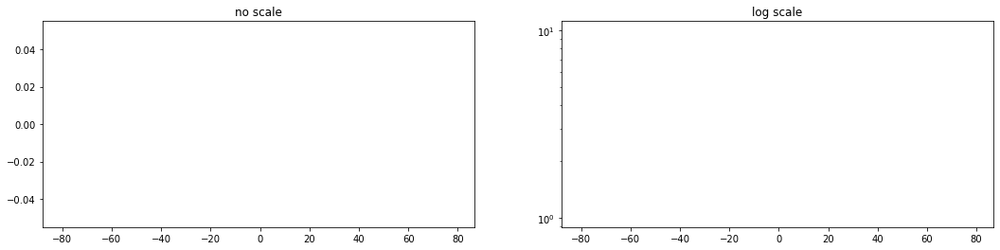

In [552]:
fig, ax = plt.subplots(1, 2, figsize=(18,4))

selfDefinedBins = range(-80, 80, 1)
ax[0].hist(remaining_part, bins = selfDefinedBins)
ax[0].hist(truncated_part, bins = selfDefinedBins, color = "red")
ax[0].title.set_text('no scale')

ax[1].set_yscale("log")
ax[1].hist(remaining_part, bins = selfDefinedBins)
ax[1].hist(truncated_part, bins = selfDefinedBins, color = "red")
ax[1].title.set_text('log scale')

plt.show()

In [506]:
list(cfqr.system.protocol.get_params(2)).index(0)

8

## save video???

In [ ]:
%%notify
import matplotlib.animation as animation
FFwriter = animation.FFMpegWriter(fps=10)
ani.save('szilard engine_real_parameters_lots_of_transitions.mp4', writer = FFwriter)


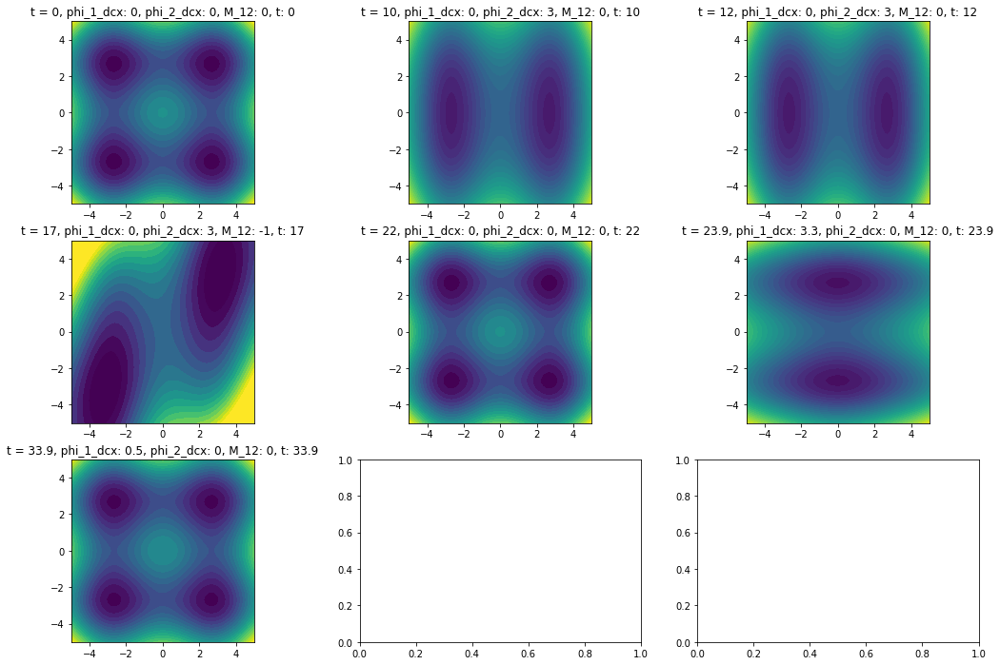

In [61]:
coupled_fq_protocol_library = importlib.reload(coupled_fq_protocol_library)
get_potential_shot_at_different_t = coupled_fq_protocol_library.get_potential_shot_at_different_t


vmin,vmax  = 0, 50
vmin, vmax = None, None
manual_domain=[[-5, -5], [5, 5]]
phi_1_dc, phi_2_dc = phi_1_dcx, phi_2_dcx
get_potential_shot_at_different_t(cfqr, computation_protocol_parameter_dict, axis1 = 0, axis2 = 1,\
                                  manual_domain=manual_domain, timeStep = None,
                                  slice_values = [0, 0, phi_1_dc, phi_2_dc], surface=False, contours = 30,
                                  vmin = vmin, vmax = vmax
                                  )

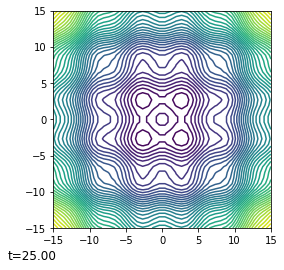

In [58]:
ani = cfqr.system.animate_protocol(manual_domain=[[-15, -15], [15, 15]], axis1=0, axis2=1, surface = False,
                                   slice_values = [0, 0, phi_1_dcx, phi_2_dcx], aspectRatio = 1)
HTML(ani.to_jshtml(fps=10))

In [59]:
def get_simulation_parameters(initial_parameter_dict, params):
    new_initial_parameter_dict = initial_parameter_dict.copy()
    for key in params.keys():
        new_initial_parameter_dict[key] = params[key]
    return new_initial_parameter_dict

In [60]:
get_simulation_parameters(initial_parameter_dict, params)

{'U0_1': 1,
 'U0_2': 1,
 'gamma_1': 20,
 'gamma_2': 20,
 'beta_1': 6.07706979287205,
 'beta_2': 6.07706979287205,
 'd_beta_1': 0,
 'd_beta_2': 0,
 'phi_1_x': 0,
 'phi_2_x': 0,
 'phi_1_dcx': 0,
 'phi_2_dcx': 0,
 'M_12': 0,
 'N': 1000,
 'dt': 0.001,
 'lambda': 1,
 'beta': 1,
 'sim_params': [array([0.00269542, 0.00067385, 0.00269542, 0.00067385]),
  array([1., 4., 1., 4.]),
  array([0.05191741, 0.05191741, 0.05191741, 0.05191741])],
 'target_work': None}

In [37]:
protocol_list

[{'duration': 0.1, 'phi_2_dcx': 3},
 {'duration': 1.25},
 {'duration': 0.1, 'M_12': -2},
 {'duration': 1.25},
 {'duration': 0.1, 'phi_2_dcx': 0, 'M_12': 0},
 {'duration': 10},
 {'duration': 0.1, 'phi_1_dcx': 3},
 {'duration': 2},
 {'duration': 0.1, 'phi_1_dcx': 0, 'M_12': 0},
 {'duration': 10}]

# Batch simulation

In [8]:
import edward_tools.cfq_batch_sweep as cfq_batch_sweep
from edward_tools import visualization

In [9]:
# initial_parameter_dict
# visualization = importlib.reload(visualization)
# couple_flux_qubit_metrics = importlib.reload(couple_flux_qubit_metrics)
# cfq_batch_sweep = importlib.reload(cfq_batch_sweep)

In [10]:
# initial_parameter_dict = {
#         "U0_1": 1,     "U0_2": 1,     "gamma_1": gamma,  "gamma_2": gamma,
#         "beta_1": beta_1,   "beta_2": beta_2,   "d_beta_1": d_beta_1 ,   "d_beta_2": d_beta_2,
#         "phi_1_x": 0,  "phi_2_x": 0,  "phi_1_dcx": phi_1_dcx,  "phi_2_dcx": phi_2_dcx,
#         "M_12": 0
# }

# protocol_list = [
#     {"duration": 10, "phi_2_dcx": 3, "name": "mix in y direction"}, # mix in y direction
#     {"duration": 2, "name": "mix in y direction (constant)"},
#     {"duration": 2, "M_12": -0.5, "name": "conditional tilt"}, # conditional tilt
#     {"duration": 5, "phi_2_dcx": 0, "M_12": 0, "name": "4 well potential (constant)"}, # 4 well potential
#     {"duration": 10, "phi_1_dcx": 3, "name": "mix in x direction"}, # mix in x direction
# #     {"duration": 2, "name": "mix in x direction (constant)"},
#     {"duration": 10, "phi_1_dcx": 0, "M_12": 0, "name": "4 well potential "}, # 4 well potential
#     {"duration": 10, "name": "4 well potential (constant)"},
# ]


In [11]:
# computation_protocol_parameter_dict = coupled_fq_protocol_library.customizedProtocol(initial_parameter_dict, protocol_list)
# storage_protocol, comp_protocol = create_system(computation_protocol_parameter_dict)
# cfqr = coupled_fq_runner.coupledFluxQubitRunner(params = params, storage_protocol= storage_protocol,  computation_protocol= comp_protocol)
# cfqr.initialize_sim()
# cfqr.set_sim_attributes()
# init_state = cfqr.init_state

In [726]:
t_c1, t_c2 = np.sqrt(L_1 * C_1), np.sqrt(L_2 * C_2)
print(f"t_c1 = {t_c1 * 1e9}ns, t_c2 = {t_c2 * 1e9}ns")

m_c1, m_c2 = C_1, C_2
print(f"m_c1 = {m_c1}F, m_c2 = {m_c2}F")

nu_c1, nu_c2 = 1/R_1, 1/R_2
print(f"nu_c1 = {nu_c1}Ω^-1, nu_c2 = {nu_c2}Ω^-1")

x_c = PHI_0 / (2 * np.pi)
print(f"x_c = {x_c}")

U_01, U_02 = m_c1 * (x_c / t_c1)**2, m_c2 * (x_c / t_c2)**2
k_BT = 1.38e-23 * 1
print(f"U_01 = {U_01:.3g}J, U_02 = {U_02:.3g}J")
print(f"U_01/k_BT = {U_01/k_BT:.3g}")

t_c1 = 2.0ns, t_c2 = 2.0ns
m_c1 = 4e-09F, m_c2 = 4e-09F
nu_c1 = 0.0026954177897574125Ω^-1, nu_c2 = 0.0026954177897574125Ω^-1
x_c = 3.291059784019349e-16
U_01 = 1.08e-22J, U_02 = 1.08e-22J
U_01/k_BT = 7.85


In [727]:
prefactor = 4.5
# prefactor = 1
I_p_1 = 2e-6 * prefactor      # Amp
I_p_2 = 2e-6 * prefactor      # Amp
I_m_1 = 7e-9 * prefactor      # Amp
I_m_2 = 7e-9 * prefactor      # Amp

R_1 = 371          # ohm
R_2 = 371          # ohm
C_1 = 4e-9         # F
C_2 = 4e-9         # F
L_1 = 1e-9         # H
L_2 = 1e-9         # H

M_12_factor = 0
M_12 = L_1 * L_2 * M_12_factor
PHI_0 = 2.067833848 * 1e-15



quick_doubler = lambda x1, x2: np.hstack([np.array([x1] * 2), np.array([x2]*2)])

I_p = quick_doubler(I_p_1, I_p_2)
I_m = quick_doubler(I_m_1, I_m_2)
R = quick_doubler(R_1, R_2)
L = quick_doubler(L_1, L_2)
C = quick_doubler(C_1, C_2)

m = np.array([1, 1/4, 1, 1/4])
nu = np.array([2, 1/2, 2, 1/2]) 
kepa = np.array([1, 1, 1, 1])

beta_1 = 2 * np.pi * L_1 * I_p_1 / PHI_0 
beta_2 = 2 * np.pi * L_2 * I_p_2 / PHI_0

d_beta_1 = 2 * np.pi * L_1 * I_m_1 / PHI_0
d_beta_2 = 2 * np.pi * L_2 * I_m_2 / PHI_0


_lambda = np.sqrt(L*C)/(R*C)  * nu /m
_theta  = 1 / m
_eta = np.sqrt(_lambda * kepa / m)


# _lambda = 1
# _theta  = 1
# _eta = 1

params = {}
params['N'] = 1000
params['dt'] = 1/1_000
params['lambda'] = 1
params['beta'] = 1
params['sim_params'] = [_lambda, _theta, _eta]
# params['tau'] = 40
params['target_work'] = None

In [730]:
manual_domain=[[-5, -5], [5, 5]]
# phi_1_dcx, phi_2_dcx = 3, 3
phi_1_dcx, phi_2_dcx = 0, 0
# phi_1_dc, phi_2_dc = 1, 1
gamma = 20
# d_beta_1, d_beta_2 = 0.6, 0.6
# d_beta_1, d_beta_2 = 0, 0


initial_parameter_dict = {
        "U0_1": 1,     "U0_2": 1,     "gamma_1": gamma,  "gamma_2": gamma,
        "beta_1": beta_1,   "beta_2": beta_2,   "d_beta_1": d_beta_1 ,   "d_beta_2": d_beta_2,
        "phi_1_x": 0,  "phi_2_x": 0,  "phi_1_dcx": phi_1_dcx,  "phi_2_dcx": phi_2_dcx,
        "M_12": 0
}

protocol_list_wanted_to_sweep = [
        {"duration": 5, "phi_2_dcx": 3, "name": "mix in y direction"}, # mix in y direction
#     {"duration": 2, "name": "mix in y direction (constant)"},
    {"duration": 8, "M_12": -1.8, "name": "conditional tilt"}, # conditional tilt
    {"duration": 100, "phi_2_dcx": 0, "M_12": 0, "name": "4 well potential (constant)"}, # 4 well potential
    {"duration": 5, "phi_1_dcx": np.linspace(3, 4, 5), "name": "mix in x direction"}, # mix in x direction
    {"duration": 7.5, "name": "mix in x direction (constant)"},
    {"duration": 2, "phi_1_dcx": 0, "M_12": 0, "name": "4 well potential "}, # 4 well potential
    {"duration": 7.5, "name": "4 well potential (constant)"},
]

In [731]:
%%notify
coupled_fq_protocol_library = importlib.reload(coupled_fq_protocol_library)
create_system = coupled_fq_protocol_library.create_system
from edward_tools import cfq_batch_sweep
cfq_batch_sweep = importlib.reload(cfq_batch_sweep)
from edward_tools import cfq_batch_sweep

sweep_protocol_list = cfq_batch_sweep.generateSweepProtocolArray(protocol_list_wanted_to_sweep)
computation_protocol_parameter_dict = coupled_fq_protocol_library.customizedProtocol(initial_parameter_dict, \
                                                                    sweep_protocol_list[0]["protocol_list"])
# print(computation_protocol_parameter_dict)
storage_protocol, comp_protocol = create_system(computation_protocol_parameter_dict)
cfqr = coupled_fq_runner.coupledFluxQubitRunner(params = params, storage_protocol= storage_protocol, \
                                                computation_protocol= comp_protocol)
cfqr.initialize_sim()
cfqr.set_sim_attributes()
init_state = cfqr.init_state

resultArray = [cfq_batch_sweep.simulateCoupledFluxQubit(params, initial_parameter_dict, item, init_state,\
                    phi_1_dcx = phi_1_dcx, phi_2_dcx = phi_2_dcx, percentage = 0.5) \
                    for item in sweep_protocol_list]

generating new initial_state
using a lower resolution for searching a space in >3 dimensions
new resolution is 50
 found 1000 samples out of 1000from system: finish the while loop.
from cfq_runner.py, The as_tep is 270
from cfq_runner.py, The dt is 0.001
from quick_sim.py
gamma: [0.00269542 0.00269542 0.00269542 0.00269542], theta: [1. 4. 1. 4.] and eta: [0.05191741 0.10383483 0.05191741 0.10383483]
from quick_sim.py: system.protocol.t_f = 135.0, system.protocol.t_f = 0.0
from simulation.py: number of steps: 135000, dt: 0.001
use old initial_state
from cfq_runner.py, The as_tep is 270
from cfq_runner.py, The dt is 0.001
from quick_sim.py
gamma: [0.00269542 0.00269542 0.00269542 0.00269542], theta: [1. 4. 1. 4.] and eta: [0.05191741 0.10383483 0.05191741 0.10383483]
from quick_sim.py: system.protocol.t_f = 135.0, system.protocol.t_f = 0.0
from simulation.py: number of steps: 135000, dt: 0.001
use old initial_state9
from cfq_runner.py, The as_tep is 270
from cfq_runner.py, The dt is 0.00

<IPython.core.display.Javascript object>

substep: 6, key: mix in x direction, value: 3.0


initial: 00 (117), final: 00 (116/117, 99.1%),10 (1/117, 0.855%), goodRatio: 100%
initial: 01 (137), final: 00 (98/133, 73.7%),10 (35/133, 26.3%), goodRatio: 97.1%
initial: 10 (114), final: 01 (30/112, 26.8%),11 (82/112, 73.2%), goodRatio: 98.2%
initial: 11 (132), final: 01 (4/132, 3.03%),11 (128/132, 97%), goodRatio: 100%


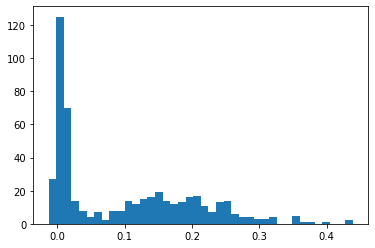

jarzyn_term: 0.9113240313436471
----------------------------------------------------------------------------------------------------
substep: 6, key: mix in x direction, value: 3.25


initial: 00 (117), final: 00 (86/117, 73.5%),10 (31/117, 26.5%), goodRatio: 100%
initial: 01 (137), final: 00 (74/132, 56.1%),10 (58/132, 43.9%), goodRatio: 96.4%
initial: 10 (114), final: 01 (35/112, 31.2%),11 (77/112, 68.8%), goodRatio: 98.2%
initial: 11 (132), final: 01 (32/132, 24.2%),11 (100/132, 75.8%), goodRatio: 100%


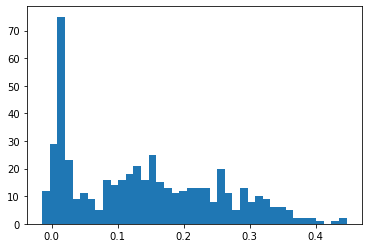

jarzyn_term: 0.8741595837681468
----------------------------------------------------------------------------------------------------


<IPython.core.display.Javascript object>

In [736]:
%%notify
from edward_tools import cfq_batch_sweep
cfq_batch_sweep = importlib.reload(cfq_batch_sweep)
cfq_batch_sweep.showResut(resultArray, [0, 1], bins = 40)

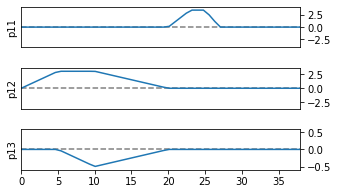

(<Figure size 360x216 with 3 Axes>,
 array([<AxesSubplot:ylabel='p11'>, <AxesSubplot:ylabel='p12'>,
        <AxesSubplot:ylabel='p13'>], dtype=object))

In [690]:
cfqr.system.protocol.show_params()

In [684]:
def truncateFinalW(final_W):
    sorted_final_W = np.sort(final_W)
    naive_jarzynski = np.mean(np.exp(-np.sort(final_W)))
    truncated_jarzynski = 0.0
    truncated_part = [0.0]

    if naive_jarzynski > 1:
        for x in range(0, len(final_W)):
            truncated_jarzynski = np.mean(np.exp(-np.sort(final_W)[x:]))
            truncated_jarzynski_next = np.mean(np.exp(-np.sort(final_W)[x+1:]))
            truncated_part = sorted_final_W[:x+1]
            remaining_part = sorted_final_W[x+1:]
            if truncated_jarzynski_next < 1 and truncated_jarzynski > 1:
                break
    else:
        for x in range(0, len(final_W)):
            truncated_jarzynski = np.mean(np.exp(-np.sort(final_W)[:-x]))
            truncated_jarzynski_next = np.mean(np.exp(-np.sort(final_W)[:-x-1]))
            truncated_part = sorted_final_W[-x-1:]
            remaining_part = sorted_final_W[:-x-1]            
            if truncated_jarzynski_next > 1 and truncated_jarzynski < 1:
                break
                
    return truncated_jarzynski, truncated_jarzynski_next, truncated_part, remaining_part
        

final_W = resultArray[3]["work_distribution"]
naive_jarzynski = np.mean(np.exp(-np.sort(final_W)))
truncated_jarzynski, truncated_jarzynski_next, truncated_part, remaining_part = truncateFinalW(final_W)
print(naive_jarzynski)
print("truncated_jarzynski = ", truncated_jarzynski)
print("truncated_jarzynski_next = ", truncated_jarzynski_next)

0.5987387570598012
truncated_jarzynski =  0.9996416140738182
truncated_jarzynski_next =  1.0001817029674995


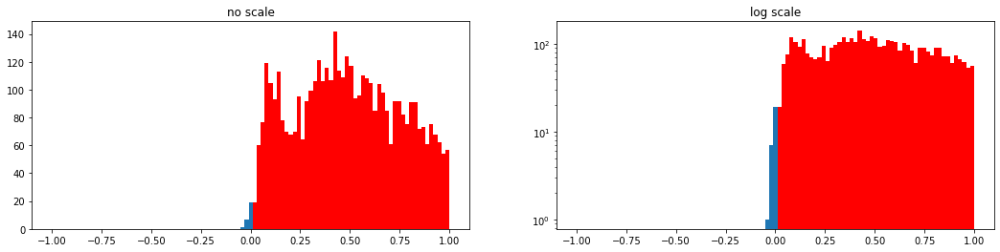

In [686]:
fig, ax = plt.subplots(1, 2, figsize=(18,4))

selfDefinedBins = np.linspace(-1, 1, 100)
ax[0].hist(remaining_part, bins = selfDefinedBins)
ax[0].hist(truncated_part, bins = selfDefinedBins, color = "red")
ax[0].title.set_text('no scale')

ax[1].set_yscale("log")
ax[1].hist(remaining_part, bins = selfDefinedBins)
ax[1].hist(truncated_part, bins = selfDefinedBins, color = "red")
ax[1].title.set_text('log scale')

plt.show()